# Basketball YOLOv11
Dataset obtained:

https://universe.roboflow.com/roboflow-universe-projects/basketball-players-fy4c2/dataset/25

Version YOLOv8 (Yv11 dataset was not downloaded so that the same dataset could be use during this training)

## Librerías iniciales

### Para limpiar el caché

#Para limpiar caché
!find . -name "*.pyc" -delete
!find . -name "__pycache__" -type d -exec rm -r {} +

### Importamos librerías

In [1]:
#Ultralytics update
!pip install -U ultralytics

In [2]:
import os
import random
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

In [3]:
#Estilo de gráficos a utilizar
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

## Plotting random train samples

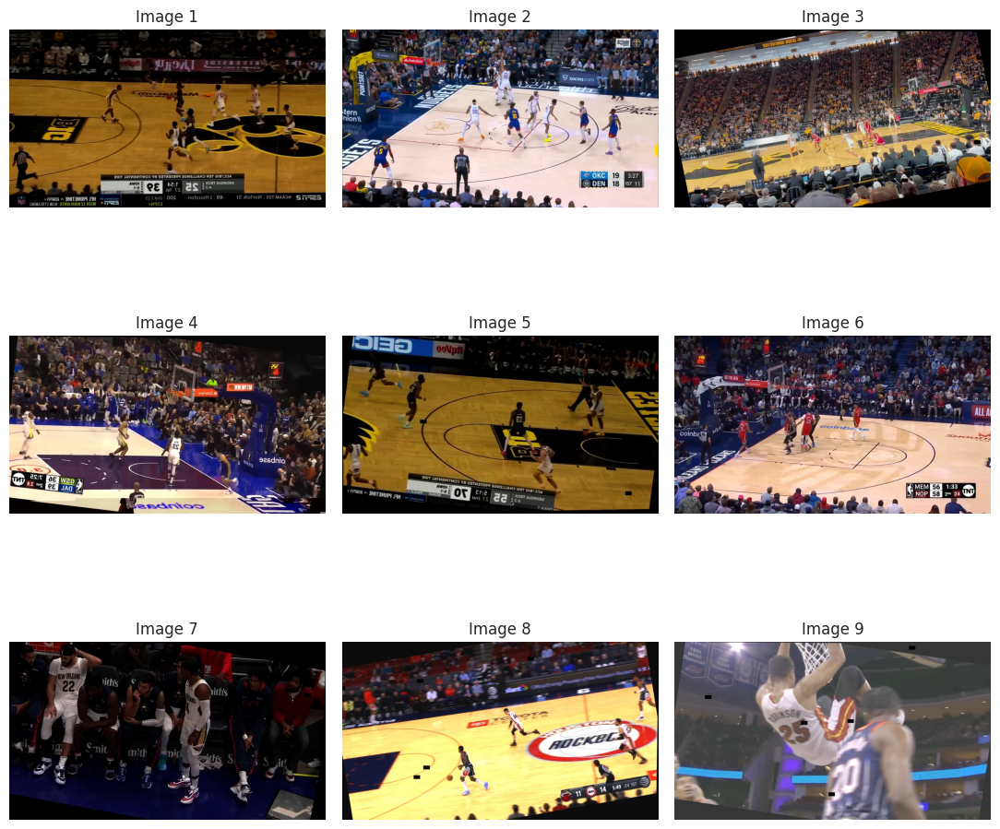

In [4]:
#Image directory for train samples
Image_dir = '/home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images'

#To show samples
num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images for plotting
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

## YOLOv5 Training

In [8]:
# Use a pretrained YOLOv11n model
model = YOLO("yolo11n.pt") 

100%|██████████████████████████████████████| 5.35M/5.35M [00:05<00:00, 1.08MB/s]



image 1/1 /home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images/Iowa_Nebraska-2023-03-06-college-men_mp4-84_jpg.rf.d3516153709fa49b1393ee3247f290ba.jpg: 384x640 6 persons, 1 traffic light, 1 umbrella, 7 chairs, 131.1ms
Speed: 2.5ms preprocess, 131.1ms inference, 6.1ms postprocess per image at shape (1, 3, 384, 640)


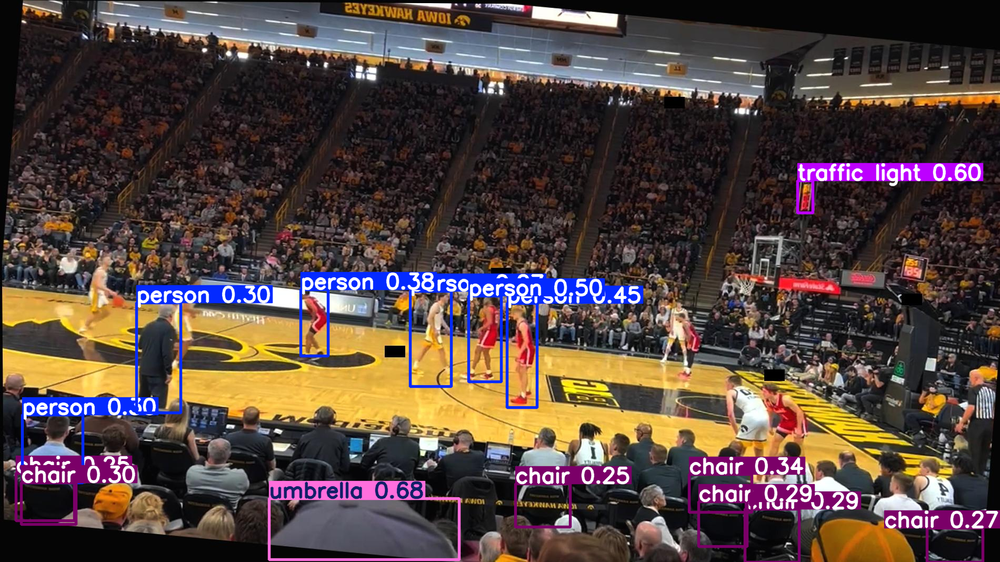

In [9]:
# Use the model to detect object
image = "/home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images/Iowa_Nebraska-2023-03-06-college-men_mp4-84_jpg.rf.d3516153709fa49b1393ee3247f290ba.jpg"
result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

In [10]:
# Build from YAML and transfer weights
Training_model = YOLO('yolo11n.pt')

In [11]:
#Training
Result_Training_model = Training_model.train(data="/home/alide/Documentos/IA/Proyecto/BasketballYv8/data.yaml",
                                             epochs = 10, batch = 4, optimizer = 'auto')

Ultralytics 8.3.103 🚀 Python-3.10.16 torch-2.6.0+cu124 CPU (AMD Ryzen 5 3500U with Radeon Vega Mobile Gfx)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/home/alide/Documentos/IA/Proyecto/BasketballYv8/data.yaml, epochs=10, time=None, patience=100, batch=4, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_

train: Scanning /home/alide/Documentos/IA/Proyecto/BasketballYv8/train/labels.ca
val: Scanning /home/alide/Documentos/IA/Proyecto/BasketballYv8/valid/labels.cach

Plotting labels to runs/detect/train/labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.559         57        640:  
       1/10         0G      1.758       2.94      1.399         57        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.468      0.202      0.192     0.0965



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.334         44        640:  
       2/10         0G      1.612      1.691      1.332         44        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.605      0.314      0.337       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.378         60        640:  
       3/10         0G       1.53      1.412      1.285         53        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.547      0.327      0.388      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.271         67        640:  
       4/10         0G       1.45      1.262      1.252         61        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.488      0.383      0.401      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment   1.23         59        640:  
       5/10         0G      1.398      1.154      1.214         44        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.531      0.407      0.451      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.193         64        640:  
       6/10         0G      1.321      1.066      1.179         78        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.528      0.442      0.443      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.149         57        640:  
       7/10         0G      1.271     0.9974      1.147         58        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.629      0.441      0.473      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.156         68        640:  
       8/10         0G      1.249     0.9656      1.135         56        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.577      0.457      0.474      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.107         73        640:  
       9/10         0G      1.199     0.9164      1.106         75        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.593      0.471      0.499       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


Corrupt JPEG data: premature end of data segment  1.102         52        640:  
      10/10         0G      1.162     0.8862      1.093         60        640: 1
                 Class     Images  Instances      Box(P          R      mAP50  m

                   all        100       1509      0.605      0.476      0.504      0.316



10 epochs completed in 1.095 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.4MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.103 🚀 Python-3.10.16 torch-2.6.0+cu124 CPU (AMD Ryzen 5 3500U with Radeon Vega Mobile Gfx)
YOLO11n summary (fused): 100 layers, 2,583,907 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        100       1509      0.606      0.475      0.504      0.316
                  Ball         68         68          1     0.0889      0.134      0.072
                  Hoop         78         78      0.898      0.679      0.819      0.503
                Period         67         68      0.171      0.133      0.135     0.0705
                Player         99        762      0.815       0.87      0.887      0.535
                   Ref         86        189      0.729      0.825      0.859      0.584
            Shot Clock         46         46      0.427      0.196      0.227      0.133
             Team Name         38         76       0.55      0.321      0.414      0.256
           Team Points         80        161       0.53      0.671      0.618      0.416
        Time Remaining         61         61      0.333      0.492      0.443      0.276
Speed: 1.3ms preprocess, 62.4ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detec

## Post-training Results

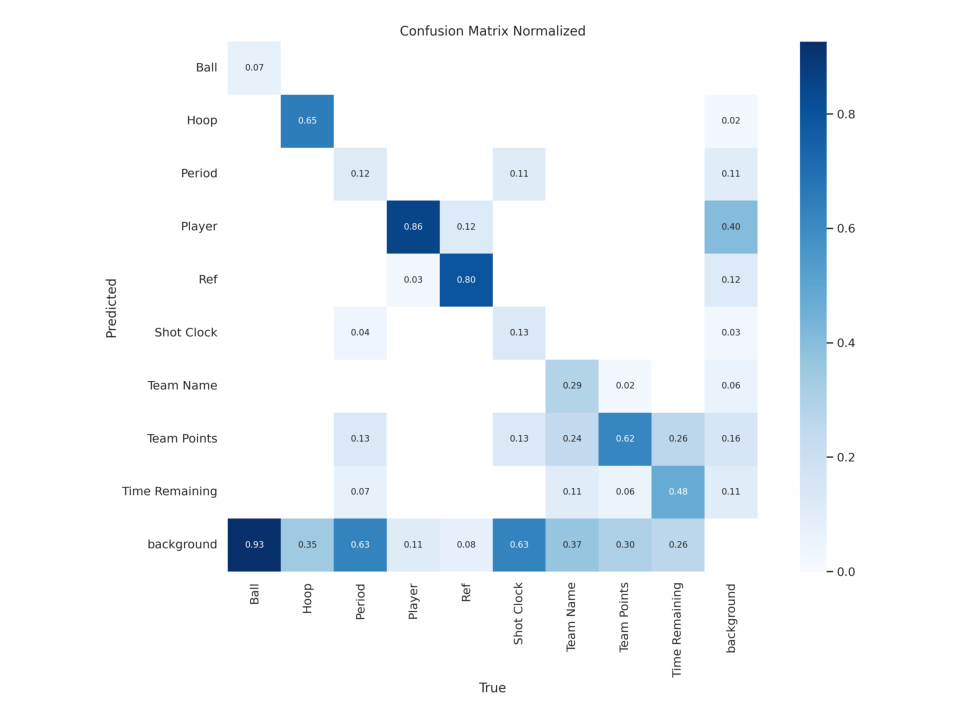

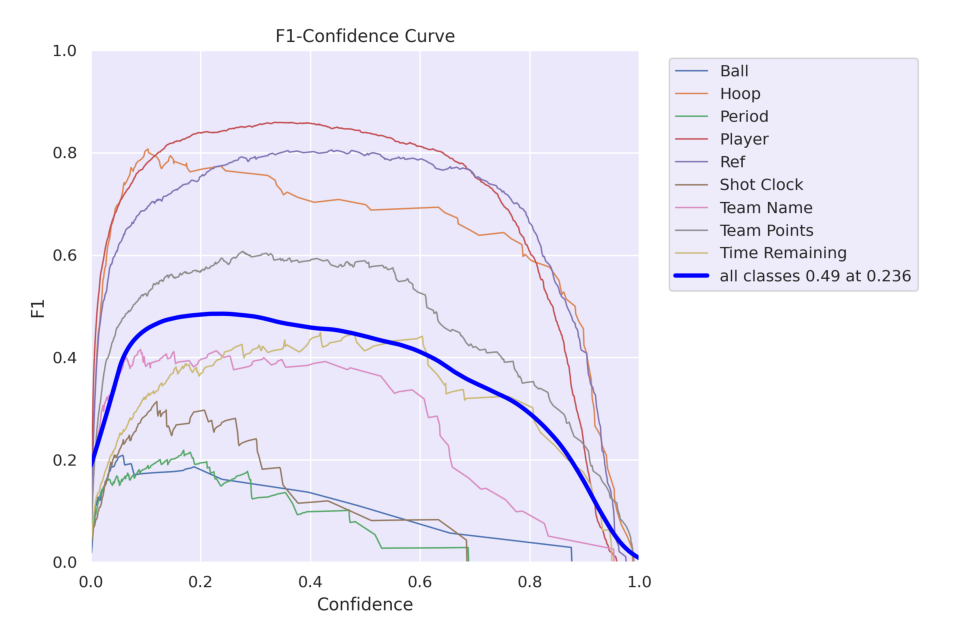

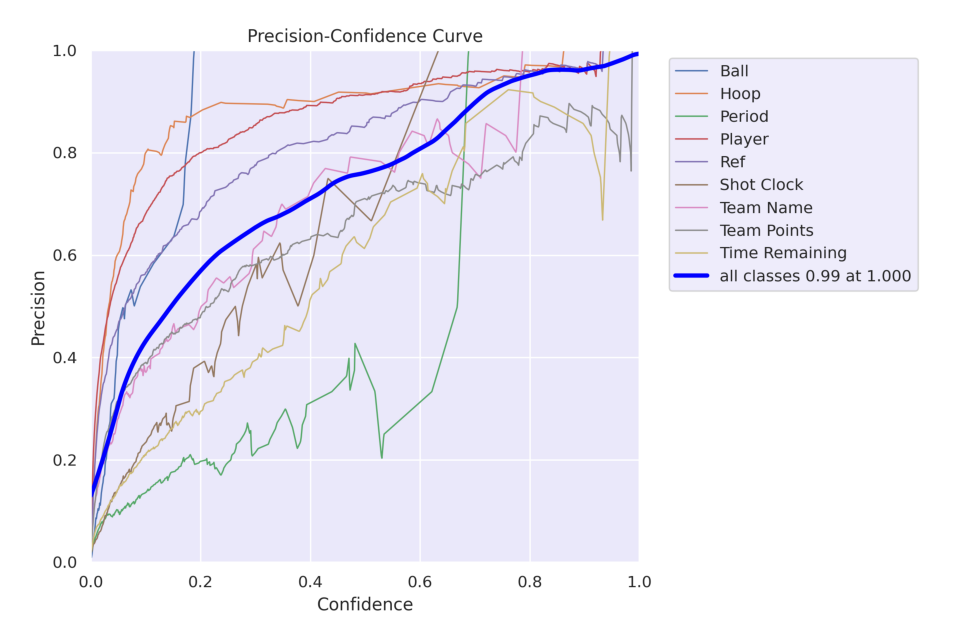

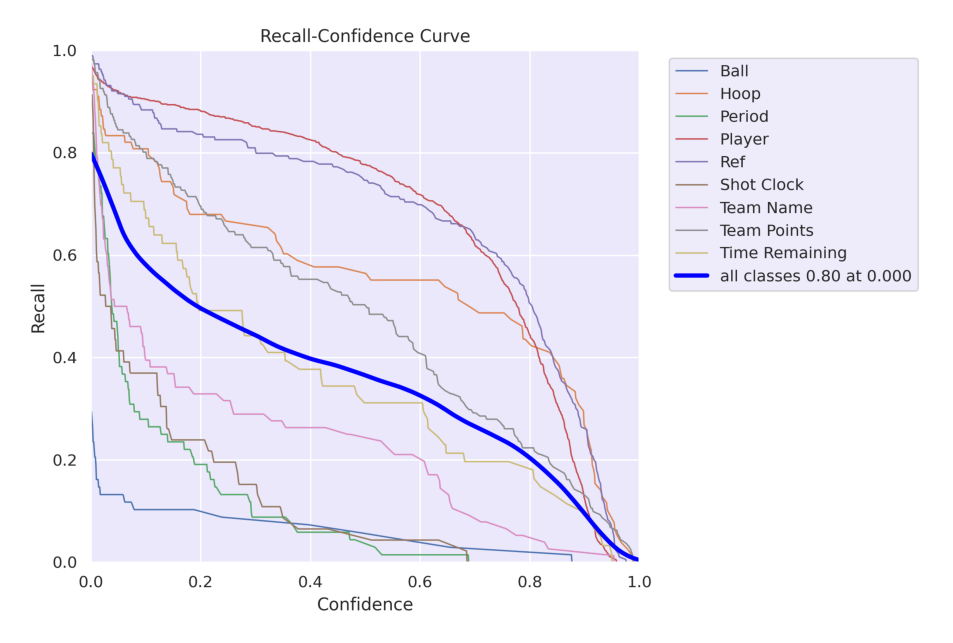

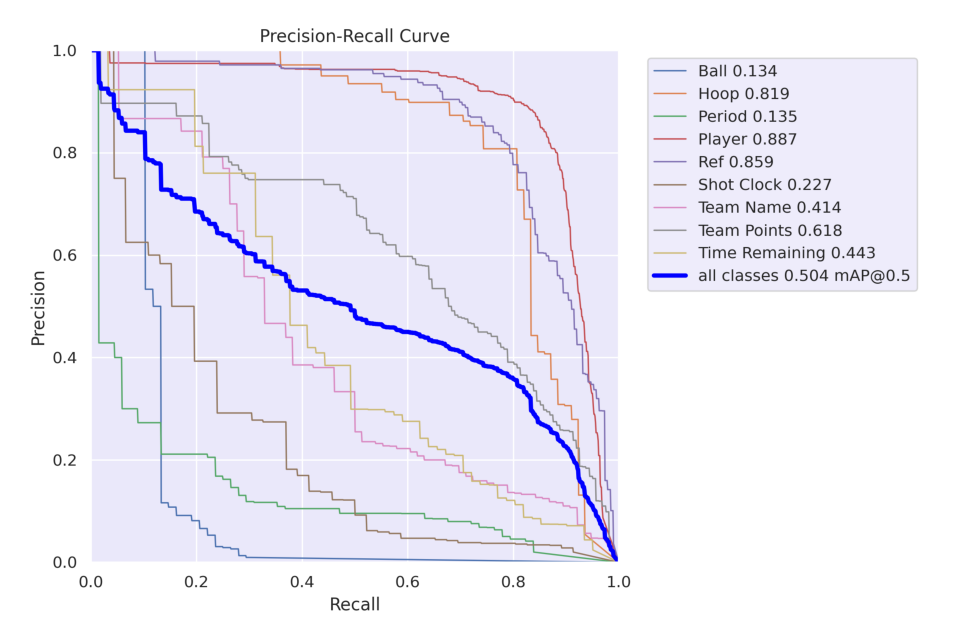

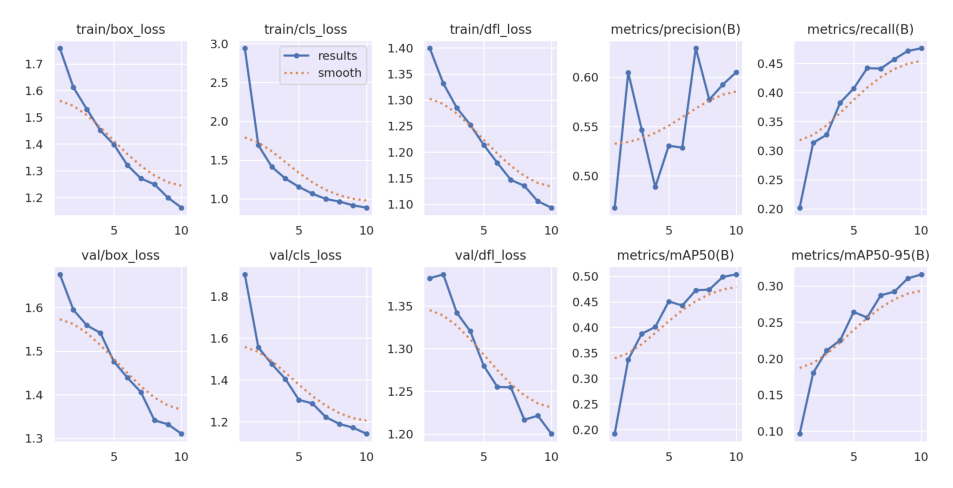

In [12]:
#Function for showing results
def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        if img is None:
            print(f"❌ Could not read image: {image_path}")
            continue
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = '/home/alide/Documentos/IA/Proyecto/runs/detect/train'

# Display the images
display_images(post_training_files_path, image_files)

## Best performing model and example

In [13]:
# Loading the best performing model
Final_model = YOLO('/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.pt')

# Evaluating the model on the validset
metrics = Final_model.val(split = 'val')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.103 🚀 Python-3.10.16 torch-2.6.0+cu124 CPU (AMD Ryzen 5 3500U with Radeon Vega Mobile Gfx)
YOLO11n summary (fused): 100 layers, 2,583,907 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /home/alide/Documentos/IA/Proyecto/BasketballYv8/valid/labels.cach
                 Class     Images  Instances      Box(P          R      mAP50  m


                   all        100       1509      0.606      0.475      0.504      0.316
                  Ball         68         68          1     0.0889      0.134      0.072
                  Hoop         78         78      0.898      0.679      0.819      0.503
                Period         67         68      0.171      0.133      0.135     0.0705
                Player         99        762      0.815       0.87      0.887      0.535
                   Ref         86        189      0.729      0.825      0.859      0.584
            Shot Clock         46         46      0.427      0.196      0.227      0.133
             Team Name         38         76       0.55      0.321      0.414      0.256
           Team Points         80        161       0.53      0.671      0.618      0.416
        Time Remaining         61         61      0.333      0.492      0.443      0.276
Speed: 0.9ms preprocess, 64.6ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detec

### Exporting the model

In [14]:
#Install dependencies
!pip install onnx
!pip install onnxruntime

In [15]:
#Export the model
Final_model.export(format='onnx')

Ultralytics 8.3.103 🚀 Python-3.10.16 torch-2.6.0+cu124 CPU (AMD Ryzen 5 3500U with Radeon Vega Mobile Gfx)

PyTorch: starting from '/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 13, 8400) (5.2 MB)
requirements: Ultralytics requirement ['onnxslim'] not found, attempting AutoUpdate...
requirements: ❌ AutoUpdate skipped (offline)

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: simplifier failure: No module named 'onnxslim'
ONNX: export success ✅ 0.8s, saved as '/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.onnx' (10.1 MB)

Export complete (1.1s)
Results saved to /home/alide/Documentos/IA/Proyecto/runs/detect/train/weights
Predict:         yolo predict task=detect model=/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.onnx imgsz=640  
Validate:        yolo val task=detect model=/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.onnx imgsz=640 

'/home/alide/Documentos/IA/Proyecto/runs/detect/train/weights/best.onnx'

### Example using Final_Model with the same img used with the pre trained model


image 1/1 /home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images/Iowa_Nebraska-2023-03-06-college-men_mp4-84_jpg.rf.d3516153709fa49b1393ee3247f290ba.jpg: 384x640 11 Players, 2 Refs, 92.9ms
Speed: 5.8ms preprocess, 92.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


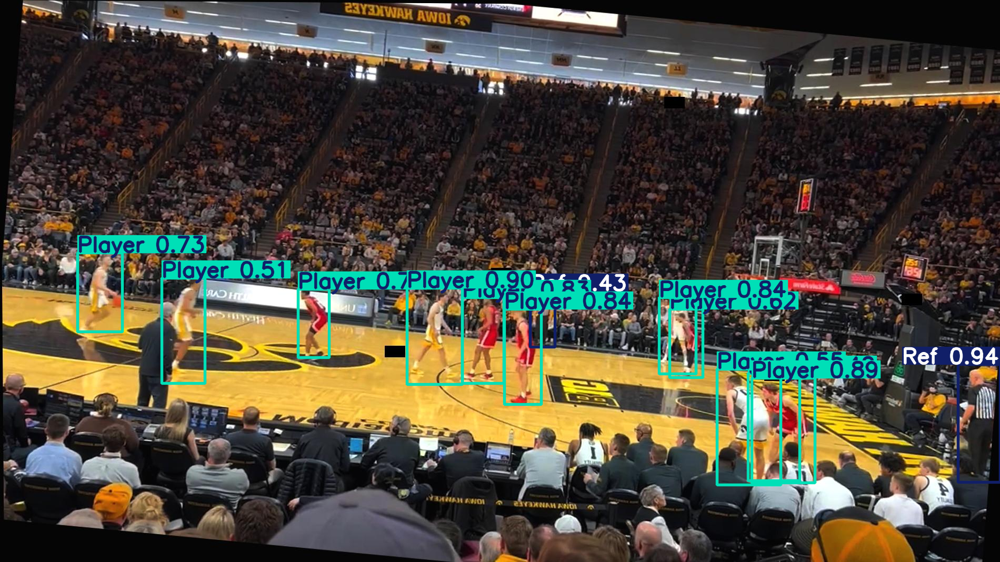

In [16]:
image = "/home/alide/Documentos/IA/Proyecto/BasketballYv8/train/images/Iowa_Nebraska-2023-03-06-college-men_mp4-84_jpg.rf.d3516153709fa49b1393ee3247f290ba.jpg"
result_predict = Final_model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

## FInal Model architecture

In [17]:
Final_model

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (act): SiLU(inplace=True)
      )
      (2): C3k2(
        (cv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(48, 64, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (m): ModuleList(
          (0): Bottleneck(
            (cv1): Conv(
              (conv): Conv2d(16, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
              (act): SiLU(inplace=True)
            )
            (cv2): Conv(
              (conv): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
              (act): SiLU(inplace=True)
    